In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/newimages12211/imaw1.jpg
/kaggle/input/newimages12211/imaw.jpg
/kaggle/input/newimages12211/imaw2.jpg
/kaggle/input/images/im2.jpg
/kaggle/input/images/im6.jpg
/kaggle/input/images/im4.jpg
/kaggle/input/images/im1.jpg
/kaggle/input/images/im3.jpg
/kaggle/input/images/im5.jpg
/kaggle/input/iame66/iame66.jpg
/kaggle/input/newimg1/new_img1.png
/kaggle/input/newimgggg/Screenshot 2023-11-30 224202.png
/kaggle/input/dataww/picsun.jpg
/kaggle/input/dataww/Screenshot 2023-11-30 213044.png
/kaggle/input/dataww/Screenshot 2023-11-30 213421.png


In [3]:
import pandas as pd
import numpy as np
import cv2
import cv2 as cv
from matplotlib import pyplot as plt
from pathlib import Path
# Used to change filepaths
from pathlib import Path
import matplotlib.pyplot as plt
%matplotlib inline
import IPython
from IPython.display import display
from PIL import Image
%matplotlib inline
import os
from PIL import Image, ImageEnhance

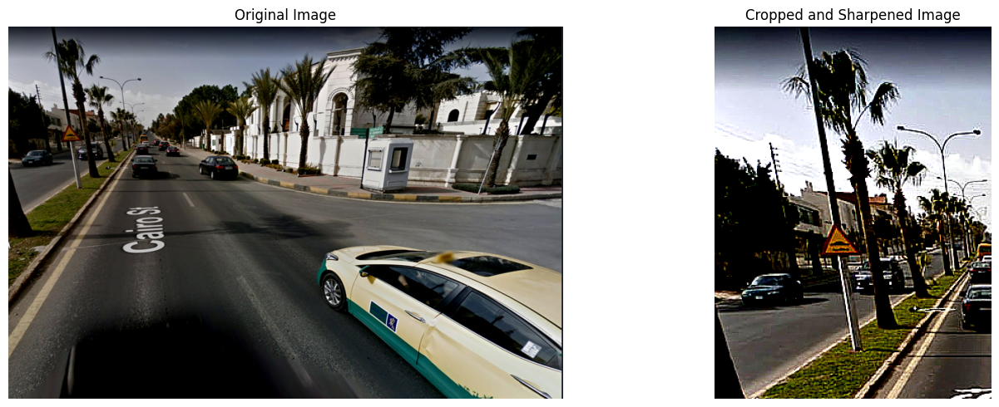

In [38]:
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

# Load the original image
original_image = Image.open("/kaggle/input/images/im3.jpg")

# Load the image
image = original_image.copy()

# Get the width and height of the image
width, height = image.size

# Define the crop region
crop_left = 0  # Crop from the left side
crop_top = 0
crop_right = width // 2
crop_bottom = height

# Crop the image
cropped_image = image.crop((crop_left, crop_top, crop_right, crop_bottom))

# Enhance contrast
factor = 1.5
enhancer = ImageEnhance.Contrast(cropped_image)
enhanced_contrast = enhancer.enhance(factor)

# Apply sharpening with increased effect
sharpened_image = enhanced_contrast.filter(ImageFilter.SHARPEN)

# Increase the sharpening effect subtly
sharpened_image = sharpened_image.filter(ImageFilter.UnsharpMask(radius=1, percent=150, threshold=2))

# Define the additional crop region on the bottom of the sharpened image
additional_crop_top = 0
additional_crop_bottom = sharpened_image.height // 2

additional_crop_left = 0
additional_crop_right = sharpened_image.width // 2 
# Perform additional cropping on the bottom of the sharpened image
cropped_sharpened_image = sharpened_image.crop((additional_crop_left, additional_crop_top, additional_crop_right, additional_crop_bottom))

# Create a new figure and axes
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Display the original image
axes[0].imshow(original_image)
axes[0].axis('off')
axes[0].set_title('Original Image')

# Display the cropped and sharpened image
axes[1].imshow(cropped_sharpened_image)
axes[1].axis('off')
axes[1].set_title('Cropped and Sharpened Image')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
#111111111111111111111111111111111111111111111

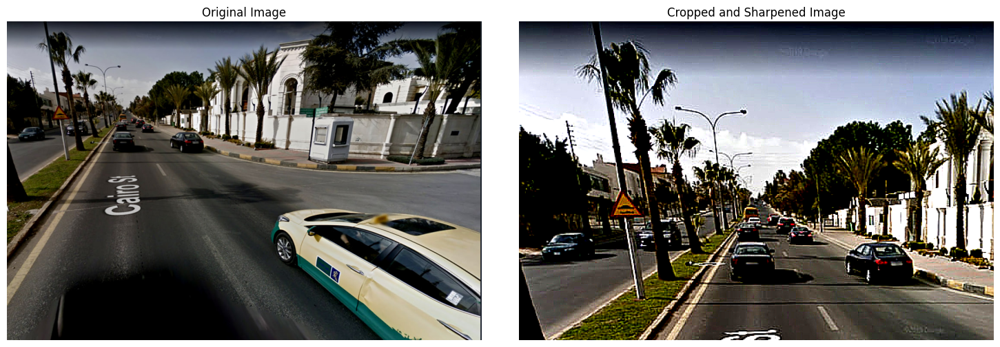

In [36]:
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

# Load the original image
original_image = Image.open("/kaggle/input/images/im3.jpg")

# Load the image
image = original_image.copy()

# Get the width and height of the image
width, height = image.size

# Define the crop region
crop_left = 0  # Crop from the left side
crop_top = 0
crop_right = width // 2
crop_bottom = height

# Crop the image
cropped_image = image.crop((crop_left, crop_top, crop_right, crop_bottom))

# Enhance contrast
factor = 1.5
enhancer = ImageEnhance.Contrast(cropped_image)
enhanced_contrast = enhancer.enhance(factor)

# Apply sharpening with increased effect
sharpened_image = enhanced_contrast.filter(ImageFilter.SHARPEN)

# Increase the sharpening effect subtly
sharpened_image = sharpened_image.filter(ImageFilter.UnsharpMask(radius=1, percent=150, threshold=2))

# Define the additional crop region on the bottom of the sharpened image
additional_crop_left = 0  # Placeholder value, adjust as needed
additional_crop_top = 0
additional_crop_right = sharpened_image.width
additional_crop_bottom = sharpened_image.height // 2

# Perform additional cropping on the bottom of the sharpened image
cropped_sharpened_image = sharpened_image.crop((additional_crop_left, additional_crop_top, additional_crop_right, additional_crop_bottom))

# Create a new figure and axes
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Display the original image
axes[0].imshow(original_image)
axes[0].axis('off')
axes[0].set_title('Original Image')

# Display the cropped and sharpened image
axes[1].imshow(cropped_sharpened_image)
axes[1].axis('off')
axes[1].set_title('Cropped and Sharpened Image')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

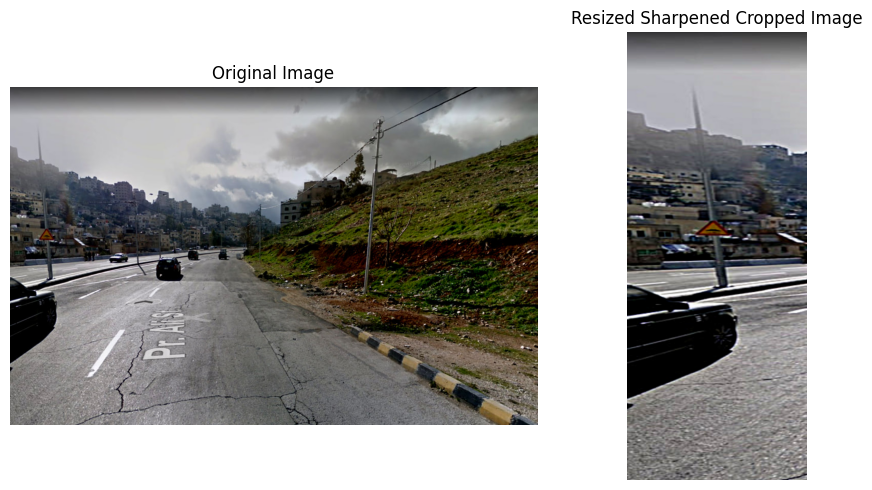

In [155]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/images/im5.jpg')

# Define the zoom factor (adjust as needed)
zoom_factor = 2

# Calculate the width and height of the zoomed region
zoom_width = int(image.shape[1] / zoom_factor)
zoom_height = image.shape[0]

# Calculate the ROI coordinates
roi_x = 0
roi_y = 0

# Extract the ROI from the image
roi = image[roi_y:roi_y + zoom_height, roi_x:roi_x + zoom_width]

# Resize the ROI using interpolation to achieve zooming
zoomed_image = cv2.resize(roi, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_LINEAR)

# Define the coordinates for the region of interest (ROI) on the zoomed image
x = 0  # Starting x-coordinate of the ROI
y = 0  # Starting y-coordinate of the ROI
width = 300  # Width of the ROI
height = image.shape[0]  # Height of the ROI (entire image height)

# Crop the zoomed image to the ROI
cropped_image = zoomed_image[y:y+height, x:x+width]

# Split the cropped image into color channels
b, g, r = cv2.split(cropped_image)

# Apply Gaussian blur to each color channel
blurred_b = cv2.GaussianBlur(b, (0, 0), 3)
blurred_g = cv2.GaussianBlur(g, (0, 0), 3)
blurred_r = cv2.GaussianBlur(r, (0, 0), 3)

# Calculate the sharpened image by subtracting the blurred image from the original image
sharpened_b = cv2.addWeighted(b, 2.0, blurred_b, -1.0, 0)
sharpened_g = cv2.addWeighted(g, 2.0, blurred_g, -1.0, 0)
sharpened_r = cv2.addWeighted(r, 2.0, blurred_r, -1.0, 0)

# Merge the sharpened color channels back into a single image
sharpened_cropped_image = cv2.merge((sharpened_b, sharpened_g, sharpened_r))

# Define the desired width and height of the final image
final_width = 2000
final_height = 5000
# Resize the sharpened cropped image to the desired size
resized_image = cv2.resize(sharpened_cropped_image, (final_width, final_height))

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image in the first subplot
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image')
ax1.axis('off')

# Display the resized sharpened cropped image in the second subplot
ax2.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
ax2.set_title('Resized Sharpened Cropped Image')
ax2.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()# tezzzzzzzzzzzzzz

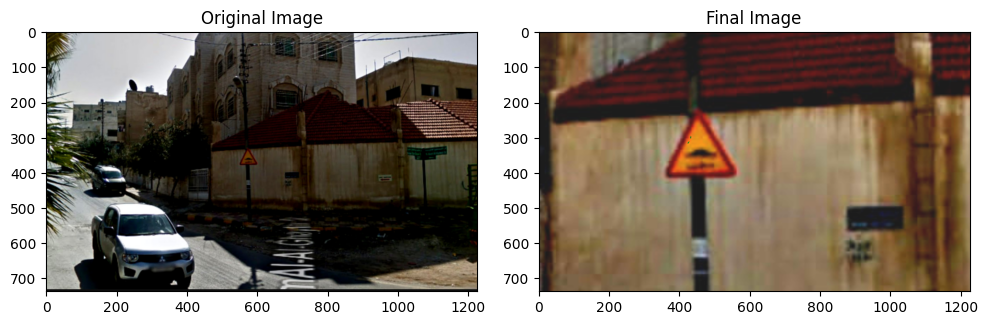

In [81]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/images/im4.jpg')

# Define the zoom factor (e.g., 2 for 2x zoom)
zoom_factor = 4

# Calculate the center coordinates of the image
height, width, _ = image.shape
center_x = width // 2
center_y = height // 2

# Calculate the width and height of the zoomed region
zoom_width = int(width / zoom_factor)
zoom_height = int(height / zoom_factor)

# Calculate the ROI coordinates
roi_x = center_x - zoom_width // 2
roi_y = center_y - zoom_height // 2

# Extract the ROI from the image
roi = image[roi_y:roi_y + zoom_height, roi_x:roi_x + zoom_width]

# Resize the ROI using interpolation to achieve zooming
zoomed_image = cv2.resize(roi, (width, height), interpolation=cv2.INTER_LINEAR)

# Define the parameters for image sharpening
kernel_size = (5, 5)
sigma = 1.0
alpha = 3.0  # Increase the alpha value for more sharpening
beta = -1.0  # Decrease the beta value for more sharpening

# Apply Gaussian blur to the zoomed image
blurred_image = cv2.GaussianBlur(zoomed_image, kernel_size, sigma)

# Calculate the sharpened image by subtracting the blurred image from the zoomed image
sharpened_image = cv2.addWeighted(zoomed_image, alpha, blurred_image, beta, 0)

# Adjust the brightness of the sharpened image
brightness = 28
brightened_image = np.clip(sharpened_image + brightness, 0, 255).astype(np.uint8)

# Display the original and final images using matplotlib
plt.figure(figsize=(10, 4))

plt.subplot(121)
plt.imshow(cv2.cvtColor(zoomed_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cv2.cvtColor(brightened_image, cv2.COLOR_BGR2RGB))
plt.title('Final Image')
plt.subplot(121)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.tight_layout()
plt.show()
#2222222222222222222222222222

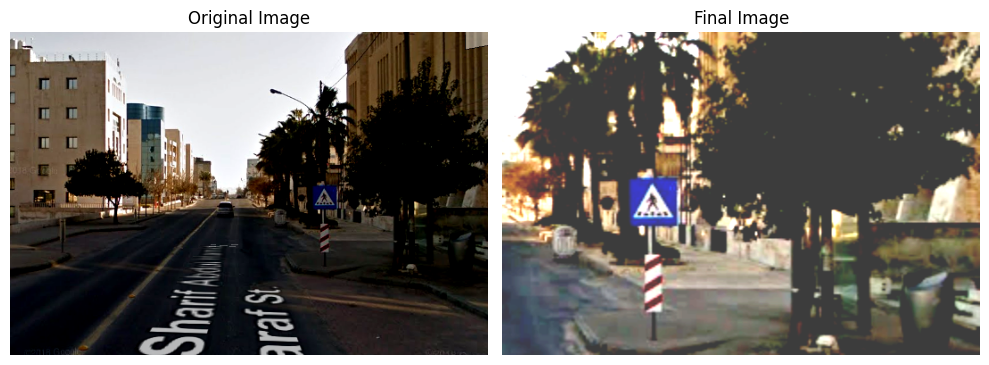

In [234]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/newimg1/new_img1.png')

# Define the zoom factor (e.g., 2 for 2x zoom)
zoom_factor = 2

# Calculate the center coordinates of the image
height, width, _ = image.shape
center_x = int(3 * width / 4)  # Use the right quarter of the image as the center
center_y = height // 2

# Calculate the width and height of the zoomed region
zoom_width = int(width / zoom_factor)
zoom_height = int(height / zoom_factor)

# Calculate the ROI coordinates
roi_x = center_x - zoom_width // 2
roi_y = center_y - zoom_height // 2

# Extract the ROI from the image
roi = image[roi_y:roi_y + zoom_height, roi_x:roi_x + zoom_width]

# Resize the ROI using interpolation to achieve zooming
zoomed_image = cv2.resize(roi, (width, height), interpolation=cv2.INTER_LINEAR)

# Convert the zoomed image to float32 data type
zoomed_image_float = zoomed_image.astype(np.float32) / 255.0

# Apply the logarithmic transformation to the zoomed image
c = 1  # Constant for controlling the transformation
adjusted = c * np.log(1 + zoomed_image_float)

# Scale the adjusted image to the range [0, 255]
adjusted = np.clip(adjusted * 255.0, 0, 255).astype(np.uint8)

# Apply unsharp masking to the adjusted image with increased sharpening
sharpened = cv2.addWeighted(adjusted, 1.2, adjusted, -0.15, 0)
brightness = 60
# Adjusts the contrast by scaling the pixel values by 2.3 
contrast = 2.3  
new_image = cv2.addWeighted(sharpened, contrast, np.zeros(sharpened.shape, sharpened.dtype), 0, brightness) 
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image in the first subplot
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image')
ax1.axis('off')

# Display the sharpened image using unsharp masking in the second subplot
ax2.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
ax2.set_title('Final Image')
ax2.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

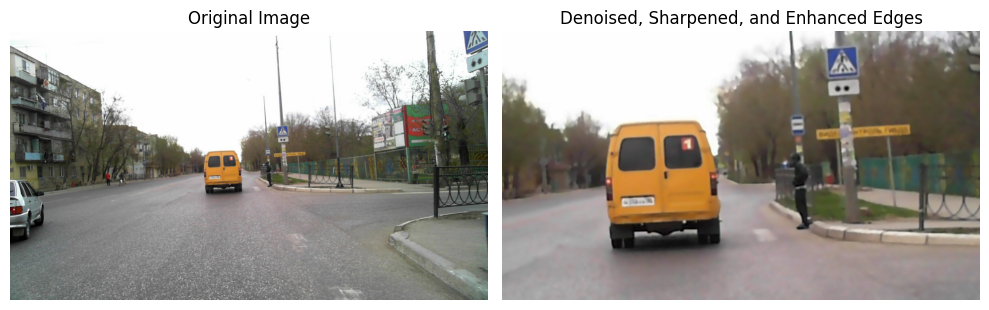

In [181]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/streetimg/imagstret1.jpg')

zoom_factor = 3

# Calculate the center coordinates of the image
height, width, _ = image.shape
center_x = width // 2
center_y = height // 2

# Calculate the width and height of the zoomed region
zoom_width = int(width / zoom_factor)
zoom_height = int(height / zoom_factor)

# Calculate the ROI coordinates
roi_x = center_x - zoom_width // 2
roi_y = center_y - zoom_height // 2

# Extract the ROI from the image
roi = image[roi_y:roi_y + zoom_height, roi_x:roi_x + zoom_width]

# Resize the ROI using interpolation to achieve zooming
zoomed_image = cv2.resize(roi, (width, height), interpolation=cv2.INTER_LINEAR)

# Split the image into color channels
b, g, r = cv2.split(zoomed_image)

# Apply Gaussian blur to each color channel
blurred_b = cv2.GaussianBlur(b, (0, 0), 3)
blurred_g = cv2.GaussianBlur(g, (0, 0), 3)
blurred_r = cv2.GaussianBlur(r, (0, 0), 3)

# Calculate the sharpened image by subtracting the blurred image from the original image
sharpened_b = cv2.addWeighted(b, 2.0, blurred_b, -1.0, 0)
sharpened_g = cv2.addWeighted(g, 2.0, blurred_g, -1.0, 0)
sharpened_r = cv2.addWeighted(r, 2.0, blurred_r, -1.0, 0)

# Merge the sharpened color channels back into a single image
sharpened_image = cv2.merge((sharpened_b, sharpened_g, sharpened_r))

# Apply non-local means denoising to the sharpened image
denoised = cv2.fastNlMeansDenoisingColored(sharpened_image, None, 10, 10, 7, 21)

# Enhance edges using Laplacian operator
laplacian = cv2.Laplacian(denoised, cv2.CV_64F)
enhanced_edges = np.clip(denoised - 0.3 * laplacian, 0, 255).astype(np.uint8)

#--------------------------------------------------------------
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image in the first subplot
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image')
ax1.axis('off')

# Display the denoised and sharpened image with enhanced edges in the second subplot
ax2.imshow(cv2.cvtColor(enhanced_edges, cv2.COLOR_BGR2RGB))
ax2.set_title('Denoised, Sharpened, and Enhanced Edges')
ax2.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
#3333333333333

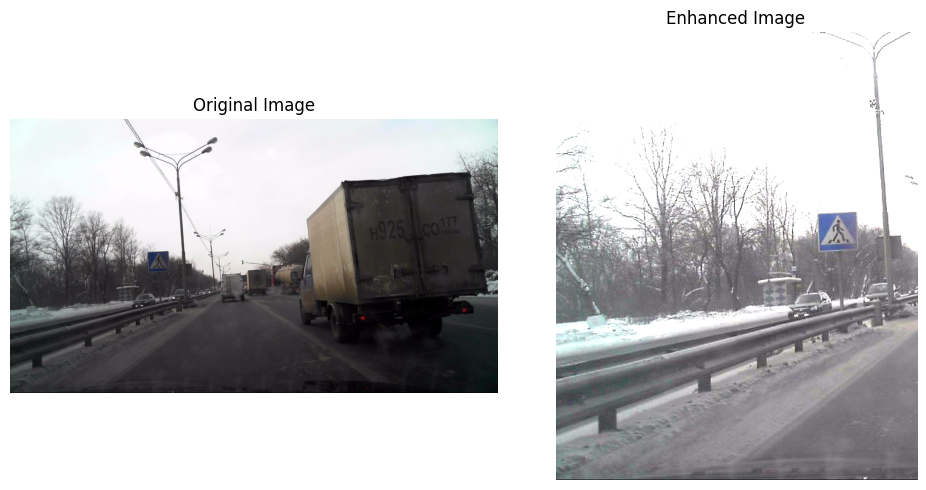

In [206]:
image = cv2.imread('/kaggle/input/streetimg/imagstret3.jpg')

# Define the coordinates for the region of interest (ROI)
x = 0  # Starting x-coordinate of the ROI
y = 100  # Starting y-coordinate of the ROI (adjust this value for the amount to crop from the top)
width = 500  # Width of the ROI
height = image.shape[0] - y  # Height of the ROI (entire image height - y)

# Crop the image to the ROI
cropped_image = image[y:y+height, x:x+width]

# Split the cropped image into color channels
b, g, r = cv2.split(cropped_image)

# Apply Gaussian blur to each color channel
blurred_b = cv2.medianBlur(b, 3)
blurred_g = cv2.medianBlur(g, 3)
blurred_r = cv2.medianBlur(r, 3)

# Calculate the sharpened image by subtracting the blurred image from the original image
sharpened_b = cv2.addWeighted(b, 2.0, blurred_b, -1.0, 0)
sharpened_g = cv2.addWeighted(g, 2.0, blurred_g, -1.0, 0)
sharpened_r = cv2.addWeighted(r, 2.0, blurred_r, -1.0, 0)

# Merge the sharpened color channels back into a single image
sharpened_cropped_image = cv2.merge((sharpened_b, sharpened_g, sharpened_r))

# Add brightness and color enhancement
alpha = 1.7  # Brightness factor
beta = 40    # Color enhancement factor
enhanced_image = cv2.convertScaleAbs(sharpened_cropped_image, alpha=alpha, beta=beta)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image in the first subplot
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image')
ax1.axis('off')

# Display the enhanced image in the second subplot
ax2.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
ax2.set_title('Enhanced Image')
ax2.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
#44444444444444444444

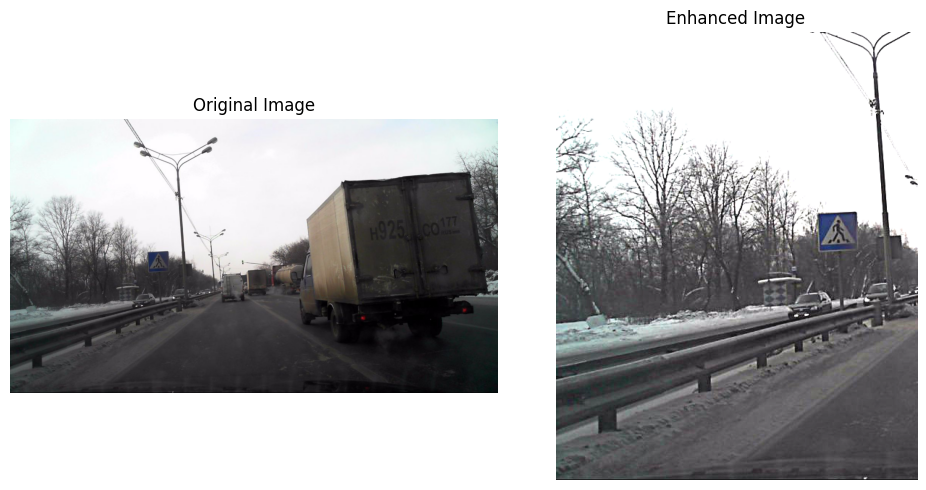

In [235]:
image = cv2.imread('/kaggle/input/streetimg/imagstret3.jpg')

# Define the coordinates for the region of interest (ROI)
x = 0  # Starting x-coordinate of the ROI
y = 100  # Starting y-coordinate of the ROI (adjust this value for the amount to crop from the top)
width = 500  # Width of the ROI
height = image.shape[0] - y  # Height of the ROI (entire image height - y)

# Crop the image to the ROI
cropped_image = image[y:y+height, x:x+width]

# Split the cropped image into color channels
b, g, r = cv2.split(cropped_image)

# Apply Gaussian blur to each color channel
blurred_b = cv2.GaussianBlur(b, (0, 0), 3)
blurred_g = cv2.GaussianBlur(g, (0, 0), 3)
blurred_r = cv2.GaussianBlur(r, (0, 0), 3)

# Calculate the sharpened image by subtracting the blurred image from the original image
sharpened_b = cv2.addWeighted(b, 2.0, blurred_b, -1.0, 0)
sharpened_g = cv2.addWeighted(g, 2.0, blurred_g, -1.0, 0)
sharpened_r = cv2.addWeighted(r, 2.0, blurred_r, -1.0, 0)

# Merge the sharpened color channels back into a single image
sharpened_cropped_image = cv2.merge((sharpened_b, sharpened_g, sharpened_r))

# Add brightness and color enhancement
alpha = 1.2  # Brightness factor
beta = 20    # Color enhancement factor
enhanced_image = cv2.convertScaleAbs(sharpened_cropped_image, alpha=alpha, beta=beta)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image in the first subplot
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image')
ax1.axis('off')

# Display the enhanced image in the second subplot
ax2.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
ax2.set_title('Enhanced Image')
ax2.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
#4444444444444444444444

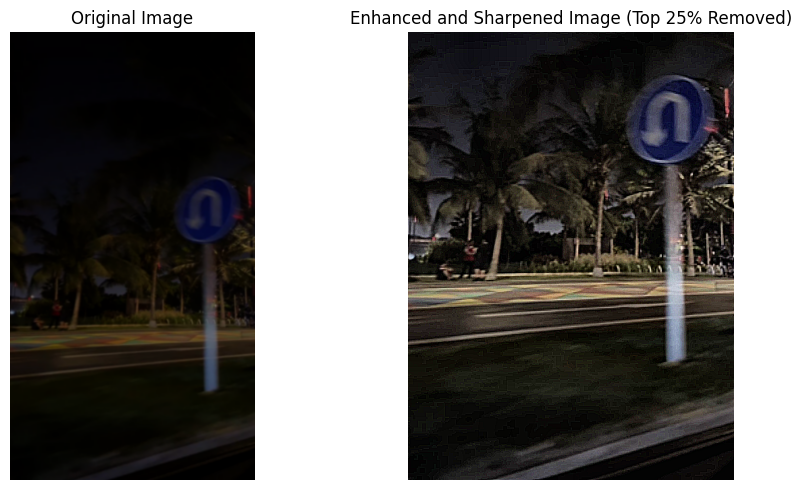

In [236]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/newimgggg/Screenshot 2023-11-30 224202.png')

# Crop the image from the top
height, width, _ = image.shape
crop_height = int(height * 0.25)  # Crop the top 25% of the image
cropped_image = image[crop_height:, :, :]

# Convert the image to YUV color space
yuv = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2YUV)

# Apply Adaptive Histogram Equalization to the Y channel (luminance)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])

# Convert the image back to BGR color space
enhanced = cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)

# Apply sharpening to the enhanced image
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]])
sharpened = cv2.filter2D(enhanced, -1, kernel)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image in the first subplot
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image')
ax1.axis('off')

# Display the enhanced image in the second subplot
ax2.imshow(cv2.cvtColor(sharpened, cv2.COLOR_BGR2RGB))
ax2.set_title('Enhanced and Sharpened Image (Top 25% Removed)')
ax2.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
#7777777777777777777777777777777

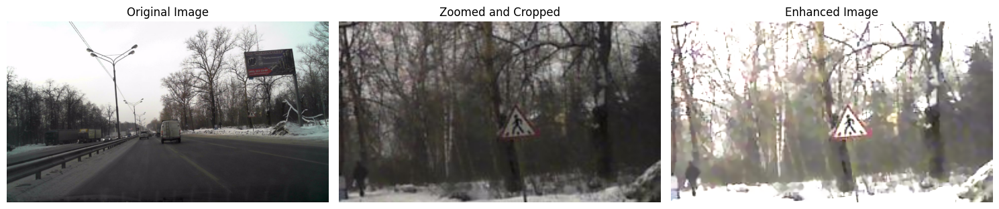

In [237]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/kaggle/input/streetimg/imagstret5.jpg')

# Define the zoom factor (e.g., 2 for 2x zoom)
zoom_factor = 5

# Calculate the center coordinates of the image
height, width, _ = image.shape
center_x = int(3 * width / 4)  # Use the right quarter of the image as the center
center_y = height // 2

# Calculate the width and height of the zoomed region
zoom_width = int(width / zoom_factor)
zoom_height = int(height / zoom_factor)

# Calculate the ROI coordinates
roi_x = center_x - zoom_width // 2
roi_y = center_y - zoom_height // 2

# Extract the ROI from the image
roi = image[roi_y:roi_y + zoom_height, roi_x:roi_x + zoom_width]

# Resize the ROI using interpolation to achieve zooming
zoomed_image = cv2.resize(roi, (width, height), interpolation=cv2.INTER_LINEAR)

# Save the zoomed and cropped image without enhancement
cv2.imwrite('zoomed_cropped.jpg', zoomed_image)

# Convert the zoomed image to float32 data type
zoomed_image_float = zoomed_image.astype(np.float32) / 255.0

# Apply the logarithmic transformation to the zoomed image
c = 1  # Constant for controlling the transformation
adjusted = c * np.log(1 + zoomed_image_float)

# Scale the adjusted image to the range [0, 255]
adjusted = np.clip(adjusted * 255.0, 0, 255).astype(np.uint8)

# Apply unsharp masking to the adjusted image with increased sharpening
amount = 4  # Sharpening factor
sharpened = cv2.addWeighted(adjusted, amount, adjusted, -1, 0)

kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]) 
# Sharpen the image 
sharpened_image = cv2.filter2D(sharpened, -1, kernel) 


denoised = cv2.fastNlMeansDenoising(sharpened_image, h=15, templateWindowSize=7, searchWindowSize=21)
# Create a figure with three subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

# Display the original image in the first subplot
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image')
ax1.axis('off')

# Display the zoomed and cropped image without enhancement in the second subplot
ax2.imshow(cv2.cvtColor(cv2.imread('zoomed_cropped.jpg'), cv2.COLOR_BGR2RGB))
ax2.set_title('Zoomed and Cropped')
ax2.axis('off')

# Display the sharpened image using unsharp masking in the third subplot
ax3.imshow(cv2.cvtColor(denoised, cv2.COLOR_BGR2RGB))
ax3.set_title('Enhanced Image')
ax3.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
#666666666666666666666666666666666666

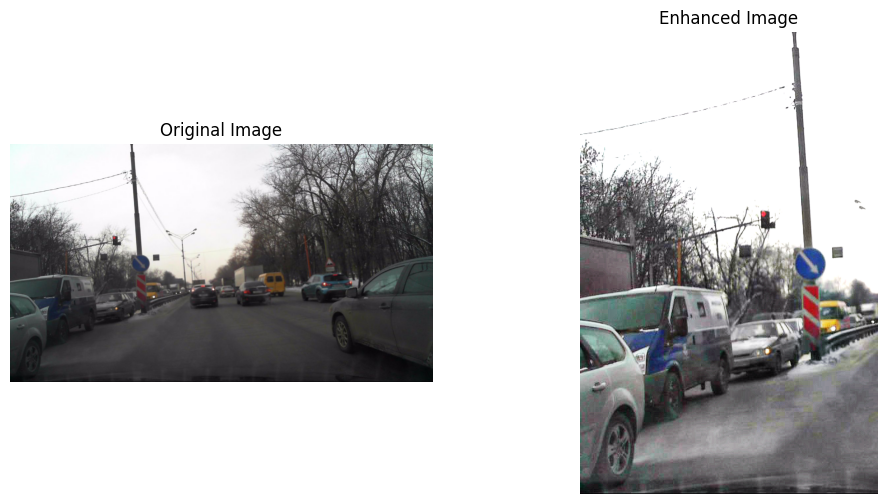

In [238]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load the image (adjust the file path accordingly)
image = cv2.imread('/kaggle/input/streetimg/imagstret2.jpg')

# Convert the image to RGB (OpenCV uses BGR by default)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
resized_image = cv2.resize(image_rgb, (3700, 2300))

# Increase brightness
brightness_factor = 1.5  # Adjust as needed
brightened_image = cv2.convertScaleAbs(resized_image, alpha=brightness_factor, beta=0)

# Apply a sharpening filter to enhance sharpness
kernel = np.array([[-1, -1, -1],
                   [-1, 9, -1],
                   [-1, -1, -1]])
sharpened_image = cv2.filter2D(brightened_image, -1, kernel)

# Define the zoomed region on the left side
zoom_factor = 2.5  # Adjust to control the zoom level
zoomed_left_part = sharpened_image[:, :int(sharpened_image.shape[1] / zoom_factor)]

# Split the zoomed left part into individual color channels
b, g, r = cv2.split(zoomed_left_part)

# Apply CLAHE separately on each color channel
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
enhanced_b = clahe.apply(b)
enhanced_g = clahe.apply(g)
enhanced_r = clahe.apply(r)

# Merge the enhanced color channels back into an RGB image
enhanced_image = cv2.merge([enhanced_b, enhanced_g, enhanced_r])

# Display the original and enhanced images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.imshow(image_rgb)
ax1.set_title('Original Image')
ax1.axis('off')

ax2.imshow(enhanced_image)
ax2.set_title('Enhanced Image')
ax2.axis('off')

plt.show()
#55555555555555555555555555

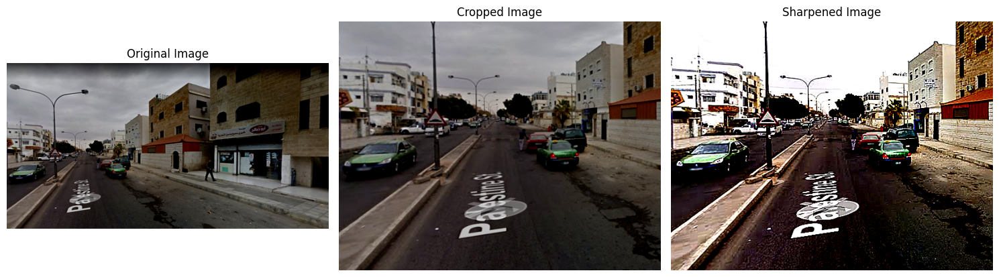

In [239]:
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

# Load the original image
original_image = Image.open("/kaggle/input/iiiiiiiiiiiiiiiiiiii/i1.png")

# Load the image
image = original_image.copy()

# Get the width and height of the image
width, height = image.size

# Define the crop region
crop_left = 0  # Crop from the left side
crop_top =  height // 4
crop_right = width // 2
crop_bottom = height

# Crop the image
cropped_image = image.crop((crop_left, crop_top, crop_right, crop_bottom))

# Enhance contrast
factor = 1.5
enhancer = ImageEnhance.Contrast(cropped_image)
enhanced_contrast = enhancer.enhance(factor)

# Apply sharpening with increased effect
sharpened_image = enhanced_contrast.filter(ImageFilter.SHARPEN)

# Increase the sharpening effect subtly
sharpened_image = sharpened_image.filter(ImageFilter.UnsharpMask(radius=1, percent=150, threshold=2))

brightness_factor = 1.5 # Adjust as needed
brightened_image = ImageEnhance.Brightness(sharpened_image).enhance(brightness_factor)

# Create a new figure and axes
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Display the original image
axes[0].imshow(original_image)
axes[0].axis('off')
axes[0].set_title('Original Image')

# Display the cropped image without modification
axes[1].imshow(cropped_image)
axes[1].axis('off')
axes[1].set_title('Cropped Image')

# Display the sharpened image
axes[2].imshow(brightened_image)
axes[2].axis('off')
axes[2].set_title('Sharpened Image')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

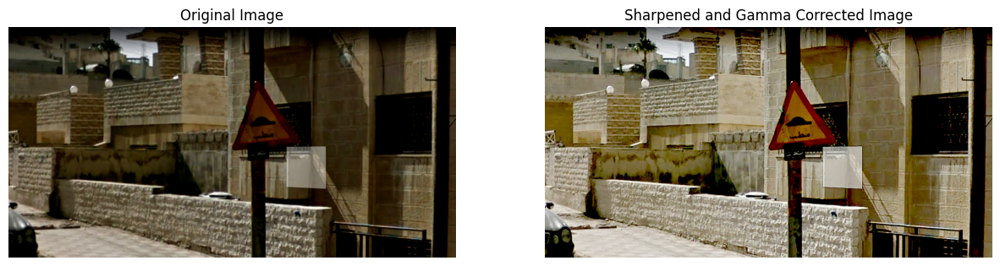

In [240]:
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Load the image
image = Image.open('/kaggle/input/iiiiiiiiiiiiiiiiiiii/i5.png')

# Enhance contrast (commented out to remove contrast enhancement)
# factor = 1.5
# enhan = ImageEnhance.Contrast(image)
# enhanced_contrast = enhan.enhance(factor)

# Convert the image to a NumPy array
img_array = np.array(image)

# Create a sharpening kernel
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Sharpen the image
sharpened_image = cv2.filter2D(img_array, -1, kernel)

# Apply gamma correction
gamma = 0.5  # Gamma value (adjust as needed)
adjusted = np.power(sharpened_image.astype(np.float32) / 255.0, gamma)
adjusted = np.clip(adjusted * 255.0, 0, 255).astype(np.uint8)

# Create a subplot with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))

# Plot the original image
ax1.imshow(image)
ax1.set_title('Original Image')
ax1.axis('off')

# Plot the sharpened and gamma-corrected image
ax2.imshow(adjusted)
ax2.set_title('Sharpened and Gamma Corrected Image')
ax2.axis('off')

# Show the plot
plt.show()

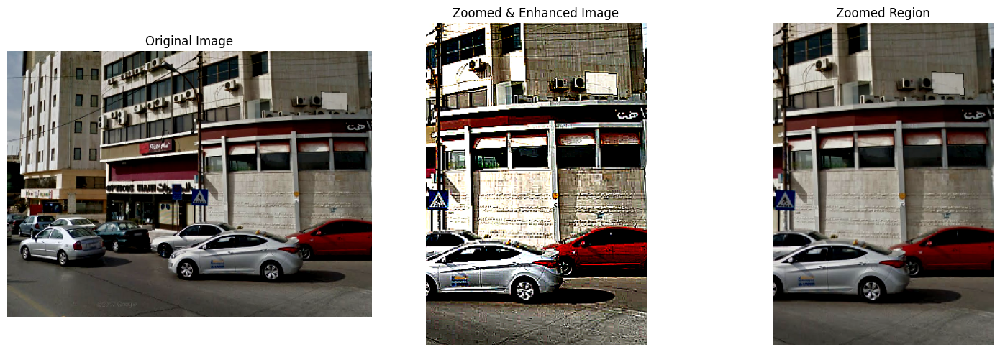

In [241]:
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt

# Load the original image
original_image = Image.open("/kaggle/input/iiiiiiiiiiiiiiiiiiii/i3.png")

# Load the image
image = original_image.copy()

# Get the width and height of the image
width, height = image.size

# Define the zoom region on the right side
zoom_left = width // 2
zoom_top = 0
zoom_right = width
zoom_bottom = height

# Crop the zoom region
zoomed_image = image.crop((zoom_left, zoom_top, zoom_right, zoom_bottom))

# Enhance contrast in the zoomed region
contrast_factor = 1.5
contrast_enhancer = ImageEnhance.Contrast(zoomed_image)
enhanced_contrast = contrast_enhancer.enhance(contrast_factor)

# Enhance brightness in the zoomed region
brightness_factor = 1.2
brightness_enhancer = ImageEnhance.Brightness(enhanced_contrast)
brightened_image = brightness_enhancer.enhance(brightness_factor)

# Apply sharpening to the zoomed region with increased effect
sharpened_image = brightened_image.filter(ImageFilter.SHARPEN)

# Increase the sharpening effect subtly
sharpened_image = sharpened_image.filter(ImageFilter.UnsharpMask(radius=1, percent=150, threshold=2))

# Create a new figure and axes
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Display the original image
axes[0].imshow(original_image)
axes[0].axis('off')
axes[0].set_title('Original Image')

# Display the zoomed and enhanced image
axes[1].imshow(sharpened_image)
axes[1].axis('off')
axes[1].set_title('Zoomed & Enhanced Image')

# Display a close-up of the zoomed region
axes[2].imshow(zoomed_image)
axes[2].axis('off')
axes[2].set_title('Zoomed Region')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()